<a href="https://colab.research.google.com/github/Kanareiika/DeepLearningSchool/blob/master/02.%20Linear%20Algebra%2C%20Numpy/%5Bhomework%5Dnumpy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Домашнее задание 2: библиотека Numpy и линейная алгебра


Импортируем библиотеки:

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import ndimage  # спецификатор для работы с изображениями
from scipy import misc
import scipy.stats as sps

from PIL import Image

%matplotlib inline

### Задание 1

В первой задаче вам предлагается перемножить две квадратные матрицы двумя способами -- без использования пакета numpy и с ним.

In [0]:
# Для генерации матриц используем фукнцию random -- она используется для генерации случайных объектов 
# функция sample создает случайную выборку. В качестве аргумента ей передается кортеж (i,j), здесь i -- число строк,
# j -- число столбцов.
a = np.random.sample((10,10))
b = np.random.sample((10,10))
# выведите размерность (ранг) каждой матрицы с помощью функции ndim.
# Используйте функцию shape, что она вывела?
# ========
# тут можно писать код 
# ========
#print(a)
#print(b)

print('ndim(A)=', a.ndim, ', shape(a)=', a.shape)

ndim(A)= 2 , shape(a)= (10, 10)


In [0]:
def mult(a, b):
    # здесь напишите перемножение матриц без 
    # использования NumPy и выведите результат
    c = np.zeros((len(a),len(b[0])))
    for i in range (len(a)):
      for j in range(len(b[0])):
        c[i,j]=(a[i,j]*b[i,j])
    return(c)

In [0]:
def np_mult(a, b):
    # здесь напишите перемножение матриц с
    # использованием NumPy и выведите результат
    return a*b

In [0]:
%%time
# засечем время работы функции без NumPy
mult(a,b)

CPU times: user 92 µs, sys: 17 µs, total: 109 µs
Wall time: 115 µs


array([[0.20906512, 0.11901903, 0.53159778, 0.20990334, 0.33015936,
        0.71475302, 0.23951938, 0.61990648, 0.76626426, 0.0054205 ],
       [0.38275987, 0.14121622, 0.5696532 , 0.7781906 , 0.13257399,
        0.07959167, 0.25462369, 0.06694242, 0.21464598, 0.30976722],
       [0.35348172, 0.27540514, 0.26188623, 0.4475233 , 0.67216827,
        0.28524671, 0.30721012, 0.14713764, 0.07968088, 0.19750784],
       [0.12122027, 0.08948937, 0.18705479, 0.78912901, 0.85714701,
        0.24185704, 0.3995364 , 0.41107383, 0.03766512, 0.85726473],
       [0.08406919, 0.04985965, 0.13506751, 0.07861655, 0.01213626,
        0.49408147, 0.70555734, 0.07795105, 0.03810503, 0.02186239],
       [0.07817328, 0.55015004, 0.59982553, 0.1013594 , 0.11846247,
        0.12475877, 0.20646801, 0.47080737, 0.60592141, 0.66378362],
       [0.30220539, 0.15562609, 0.13340701, 0.28891791, 0.23015312,
        0.2080272 , 0.09822882, 0.05143138, 0.26358073, 0.56064418],
       [0.15311312, 0.05809765, 0.1810567

In [0]:
%%time
# засечем время работы функции с NumPy
np_mult(a,b)

CPU times: user 21 µs, sys: 4 µs, total: 25 µs
Wall time: 28.4 µs


array([[0.20906512, 0.11901903, 0.53159778, 0.20990334, 0.33015936,
        0.71475302, 0.23951938, 0.61990648, 0.76626426, 0.0054205 ],
       [0.38275987, 0.14121622, 0.5696532 , 0.7781906 , 0.13257399,
        0.07959167, 0.25462369, 0.06694242, 0.21464598, 0.30976722],
       [0.35348172, 0.27540514, 0.26188623, 0.4475233 , 0.67216827,
        0.28524671, 0.30721012, 0.14713764, 0.07968088, 0.19750784],
       [0.12122027, 0.08948937, 0.18705479, 0.78912901, 0.85714701,
        0.24185704, 0.3995364 , 0.41107383, 0.03766512, 0.85726473],
       [0.08406919, 0.04985965, 0.13506751, 0.07861655, 0.01213626,
        0.49408147, 0.70555734, 0.07795105, 0.03810503, 0.02186239],
       [0.07817328, 0.55015004, 0.59982553, 0.1013594 , 0.11846247,
        0.12475877, 0.20646801, 0.47080737, 0.60592141, 0.66378362],
       [0.30220539, 0.15562609, 0.13340701, 0.28891791, 0.23015312,
        0.2080272 , 0.09822882, 0.05143138, 0.26358073, 0.56064418],
       [0.15311312, 0.05809765, 0.1810567

### Задание 2

Напишите функцию, которая по данной последовательности $\{A_i\}_{i=1}^n$ строит последовательность $S_n$, где $S_k = \frac{A_1 + ... + A_k}{k}$.
Аналогично -- с помощью библиотеки NumPy и без нее. Сравните скорость, объясните результат.

In [0]:
# функция, решающая задачу с помощью NumPy

n = 10.1
A = np.arange(1, n, 0.5)

def sec_av(A):
    # Ваш код здесь
    S = np.cumsum(A) / np.arange(1, len(A)+1)
    return S

print (sec_av(A))

[1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5  3.75 4.   4.25
 4.5  4.75 5.   5.25 5.5 ]


In [0]:
# функция без NumPy
def stupid_sec_av(A):
    sum=0
    S = [0 for i in range(len(A))]
    for i in range(len(A)):
      sum = sum + A[i]
      S[i] = sum/(i+1)
    return S

print (stupid_sec_av(A))

[1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75, 3.0, 3.25, 3.5, 3.75, 4.0, 4.25, 4.5, 4.75, 5.0, 5.25, 5.5]


In [0]:
# зададим некоторую последовательность и проверим ее на ваших функциях. 
# Первая функция должна работать ~ в 50 раз быстрее
A = sps.uniform.rvs(size=10 ** 7) 

%time S1 = sec_av(A)
%time S2 = stupid_sec_av(A)
#проверим корректность:
np.abs(S1 - S2).sum()

CPU times: user 84.6 ms, sys: 57.2 ms, total: 142 ms
Wall time: 142 ms
CPU times: user 5 s, sys: 234 ms, total: 5.23 s
Wall time: 5.24 s


0.0

### Задание 3

Пусть задан некоторый массив $X$. Надо построить новый массив, где все элементы с нечетными индексами требуется заменить на число $a$ (если оно не указано, то на 1). Все четные элементы исходного массива нужно возвести в куб и записать в обратном порядке относительно позиций этих элементов. Массив $X$ при этом должен остаться без изменений. В конце требуется слить массив $X$ с преобразованным $X$ и вывести в обратном порядке.

In [0]:
# функция, решающая задачу с помощью NumPy
def transformation(X, a=1):
    # Ваш код здесь
    Y = np.array(X[::-1])
    Y[1::2] = a
    Y[::2] = Y[::2] ** 3
    Y = np.hstack((np.array(X),Y))
    return Y

In [0]:
# функция, решающая задачу  без NumPy

def stupid_transformation(X, a=1):
    # Ваш код здесь
    Y = [X[i] for i in range(len(X))]
    for i in range(1, len(X), 2):
      Y[i]=a
    for i in range(0, len(X), 2):
      Y[i]=(X[(len(X)-1)-i])**3
    Y = X + Y
    return Y

In [0]:
print(transformation(np.array([1,3,4,2,4,8,9]), 777))
print(stupid_transformation([1,3,4,2,4,8,9], 777))

[  1   3   4   2   4   8   9 729 777  64 777  64 777   1]
[1, 3, 4, 2, 4, 8, 9, 729, 777, 64, 777, 64, 777, 1]


In [0]:
X = [i for i in range(1, 10*100, 10)]
# здесь код эффективнее примерно в 20 раз. 
# если Вы вдруг соберетесь печатать массив без np -- лучше сначала посмотрите на его размер
%time S1 = transformation(X)
%time S2 = stupid_transformation(X)
# проверим корректность:
np.abs(S1 - S2).sum()

CPU times: user 1.55 ms, sys: 60 µs, total: 1.61 ms
Wall time: 1.7 ms
CPU times: user 155 ms, sys: 18.1 ms, total: 173 ms
Wall time: 174 ms


0

Что вы можете сказать о скорости вычислений в `NumPy`? Ответ обоснуйте.

**Ответ:** Скорость вычислений в NP для операций с матрицами значительно выше благодаря использованию кода на C/C++, который гораздо лучше оптимизирован под решение задач с многократными итерациями.

### Задание 4

Вам подаются на вход два вектора `a` и `b` в трехмерном пространстве.Заполните их случайными числами. Реализуйте их скалярное произведение с помощью  `NumPy` и без. Засеките время работы, как это показано в заданиях выше.

In [0]:
a = np.random.sample((1,3))
b = np.random.sample((1,3))

In [0]:
def stupid_scalar_product(a,b):
    x=[a[0,i]*b[0,i] for i in range(0,len(a[0]))] #тут я довольно долго недоумевала, почему же не работает a[i]*b[i] :)
    return(sum(x))

In [0]:
stupid_scalar_product(a,b)

0.3987194753804606

In [0]:
def numpy_scalar_product(a,b):
    return(a.dot(b.T))

In [0]:
numpy_scalar_product(a,b)

array([[0.39871948]])

In [0]:
%time product_1 = stupid_scalar_product(a,b)
%time product_2 = numpy_scalar_product(a,b)
# проверим корректность:
np.abs(product_1 - product_2).sum()

CPU times: user 26 µs, sys: 3 µs, total: 29 µs
Wall time: 33.6 µs
CPU times: user 28 µs, sys: 3 µs, total: 31 µs
Wall time: 34.3 µs


0.0

### Задание 5*

Нужно написать матричное произведение БЕЗ циклов и БЕЗ символа @, БЕЗ `np.dot` и вообще БЕЗ какой-либо вспомогательной функции из `numpy`, то есть пользуясь только индексированием, взятем суммы по нужным осям и поэлементным произведенем (да, это возможно). Рекомендуем гуглить по запросу "NumPy broadcasting"

In [0]:
def cool_matrix_product(A, B):
    return()

In [0]:
A=np.arange(0,6,1).reshape(2,3)
B=np.arange(0,6,1).reshape(3,2)
cool_matrix_product(A, B)

()

Ваш код не будет проверяться нами непосредственно, однако это очень и очень полезное упражнение.

## Бонусная часть (в тесте вопросов по ней не будет)

###Задание 1*

Image = 2-D численный массив
(или 3-D: CT, MRI, 2D + time; 4-D, …)
В текущем задании, image == Numpy array (np.array)

In [0]:
pic = misc.face()  # встроенная в библиотеку функция, которая загружает картинку с енотом

Выведите тип и размеры для переменной pic. Что лежит внутри?

In [0]:
print('Type of pic is', pic.dtype, '\nShape of pic is', pic.shape)

Type of pic is uint8 
Shape of pic is (768, 1024, 3)


Если вы все сделали правильно, что для формы у вас выведется кортеж из трех чисел: (X, Y, 3). Предположите, откуда там 3?

**Ответ:** третья ось - ось цвета пикселя в RGB

С помощью функции ниже можно вывести изображение и посмотреть, что находится внутри:

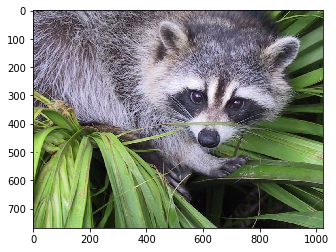

In [0]:
plt.imshow(pic)

Убедитесь, что внутри массива `pic` действительно лежат числа. Выведите первые 10 записей.
Массив состоит из троек чисел, которые характеризуют глубину цвета для каждого пикселя. Из пикселей складывается картинка.

In [0]:
print(pic[0,:10,])

[[121 112 131]
 [138 129 148]
 [153 144 165]
 [155 146 167]
 [155 146 167]
 [158 148 172]
 [159 149 173]
 [156 146 170]
 [147 138 159]
 [137 128 149]]


Выведите значение максимального элемента в матрице. Выведите значение минимального. Выведите среднее по всем элементам матрице. В каких пределах лежат значения глубины цветов?

In [0]:
print('Максимальное значение -', ((pic.max(axis=2)).max(axis=1)).max(axis=0), '\nМинимальное значение -', ((pic.min(axis=2)).min(axis=1)).min(axis=0), '\nГлубина цвета составляет 24 бита - по 8 бит на каждый канал') #это какой-то адский костыль, но я пока не поняла, как можно нормально сделать

Максимальное значение - 255 
Минимальное значение - 0 
Глубина цвета составляет 24 бита - по 8 бит на каждый канал


### Задание 2

Теперь загрузим черно-белое изображение енота, чтобы наш массив был не 3-х мерным тензором, а двумерным массивом. Тензоры обрабатываются точно также, но для простоты пока что давайте работать с двумерными массивами, т.е. матрицами.

In [0]:
pic = misc.face(gray=True)

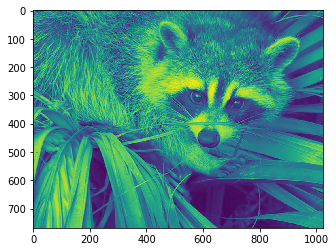

In [0]:
plt.imshow(pic)

Выведите форму (shape) полученной картинки `pic`. Какие выводы можно сделать? Положите в `h`,`w` высоту и ширину картинки.

In [0]:
print(pic.shape)
h,w=len(pic),len(pic[0])
hh,ww=pic.shape[0],pic.shape[1]
if (not((h-hh)+(w-ww))):
  print('Всё сходится')

(768, 1024)
Всё сходится


Используя библиотеку `numpy`, отразите изображение по горизонтали. Выведите картинку.

Подсказка: не забывайте, что изображения -- это просто двумерные массивы

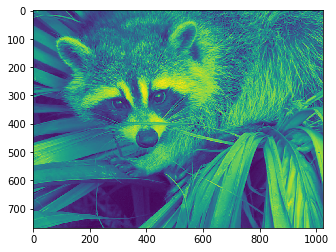

In [0]:
pic=pic[::,len(pic[0])::-1]
plt.imshow(pic)

Теперь давайте повысим контрастность -- для этого к каждому пикселю прибавим 50 единиц

In [0]:
pic2=pic+50

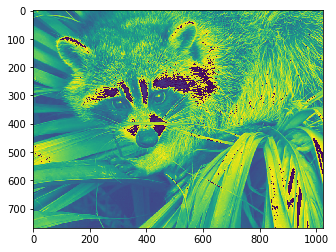

In [0]:
plt.imshow(pic2)

Теперь давайте попробуем превратить наше одноканальное изображение в трехканальный (RGB) тензор. Для этого вместо каждого пикселя в одноканальном изображении (в двумерном массиве) поставим кортеж из трех элементов -- глубины красного, зеленого и голубого соотвественно. Восстановить по ч/б картинке цветной мы не можем, так как мы не можем взять утерянную информацию из ниоткуда, но можем усилить черные и белые участки. Для этого давайте заполним все три канала одинаковыми значениями, деленными на что-то очень большое. Например $--$ на $200$.  То есть, например, если в пикселе `pic[i][j]` лежало значение **200**, то для нового изображения `new_pic` мы заполняем `new_pic[i][j]` кортежем из трех чисел `int(pic[i][j]/3)`. Функция `int` $--$ округление до целой части.

In [0]:
new_pic = np.zeros((h,w,3)) #создадим пустую матрицу, куда будем записывать значения
for i in range(h):
    for j in range(w):
     new_pic[i,j,]=pic[i,j]/200

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


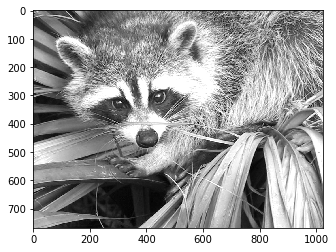

In [0]:
plt.imshow(new_pic)

### Задание 3

Теперь давайте уменьшим качество картинки в 16 раз, путем уменьшения качества изображения, т.е. теперь 16 пикселей по близости надо заполнить одним значением.

In [0]:
from sklearn.datasets import load_sample_image #импорт загрузчика изображения

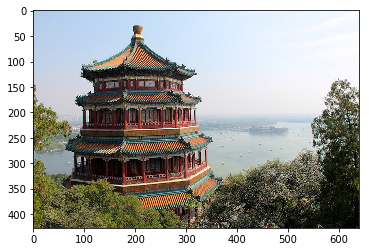

In [0]:
china = load_sample_image('china.jpg')
plt.imshow(china)

Запишите в переменные `h`, `w`, `c` высоту, ширину, количество каналов соответственно для картинки `china`.

In [0]:
h, w, c = len(china), len(china[0]), len(china[0,0])
print(h,w,c)

427 640 3


Теперь давайте непосредственно перейдем к изменению картинки $--$ мы предлагаем разбивать картинки на квадраты 4 на 4 и заполнять все 16 значений внутри квадрата левым верхним значением. Вы можете сделать иначе.

In [0]:
from copy import copy
compressed_pic = copy(china)
step=4
for i in range(0,h,step):
  for j in range(0,w,step):
    compressed_pic[i-step:i,j-step:j]=china[i-step,j-step]

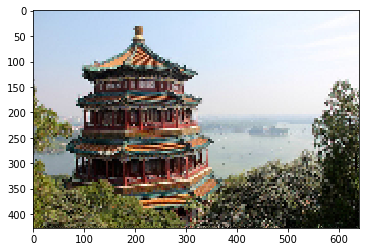

In [0]:
plt.imshow(compressed_pic)

Напишите функцию, которая считает несоотвествие между исходной и сжатой картинкой. Запустите ваш код для `compressed_pic`, `china`

In [0]:
def calculate_mismatch(a,b):
    mismatch=a-b
    return(mismatch)

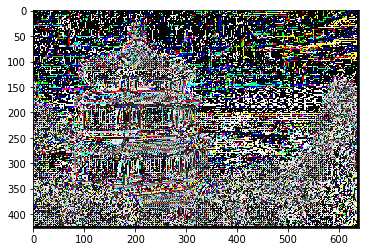

In [0]:
plt.imshow(calculate_mismatch(china,compressed_pic))

Посчитайте синус от каждого значения пикселей изображения `china` по всем каналам. Выведите картинку. Используйте функцию `np.sin` 

In [0]:
china = load_sample_image('china.jpg')
sinpic = np.sin(china).astype(np.float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


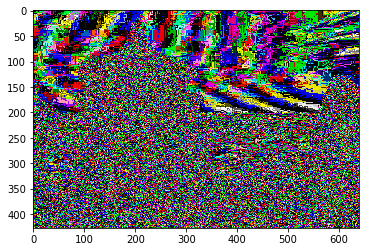

In [0]:
plt.imshow(sinpic)

Посмотрите на полученный результат. Как вы думаете, что можно делать с помощью такого преобразования? Какого рода объекты можно распознать?

### Задание 4*

Теперь давайте поработаем с аудиофайлами. Стандартный аудиофайл представляет собой обычный набор чисел, в котором хранятся значения частот, снятых с определенной периодичностью. Итак, самая простая аудиодорожка $-$ одномерный массив.

Первое, что нужно сделать $--$ установить библиотеку для работы с аудио. Она называется `librosa`. Гайд по установке: https://librosa.github.io/librosa/install.html


In [0]:
import librosa #импортируем библиотеку
import IPython.display

In [0]:
audio, sr= librosa.load(librosa.util.example_audio_file())
# записываем наш массив звуковых частот в файл аудио, sr -- число точек, записываемых в секунду.
audio = np.array(audio)

Нашу дорожку можно воспроизвести в самом файле `.ipynb`:

In [0]:
IPython.display.Audio(audio, rate=sr)

Выведите тип данных переменной `audio`, найдите ее длительность и среднее.

In [0]:
print('Type is', audio.dtype, '\nLen is', len(audio), '\nMean is', np.mean(audio), '\nsr is', sr)

Type is float32 
Len is 1355168 
Mean is -2.3661802e-05 
sr is 22050


    Давайте посмотрим, как выглядит наша дорожка. Для этого используем библиотеку `matplotlib.pyplot`

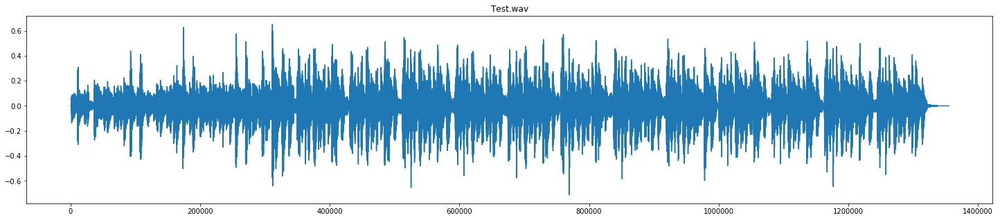

In [0]:
plt.figure(figsize=(25,5))
plt.title('Test.wav')
plt.plot(audio)

Обрежьте последние 4 секунды файла

In [0]:
audio = audio[:(len(audio) - 4*sr)]
IPython.display.Audio(audio, rate=sr)

Давайте уменьшим амплитуду на 25%. Что при этом изменится? Напоминаю, что вы всегда можете послушать изменения при помощи `IPython.display.Audio`

In [0]:
audio = audio*0.75
IPython.display.Audio(audio, rate=sr)

А еще аудиодорожку можно ускорить. Для этого попробуйте потюнить параметр `rate`

In [0]:
IPython.display.Audio(audio, rate=sr*2)